<html>
<head>
<style>
    body {
        font-family: 'Arial', sans-serif;
        margin-left: 40px;
        background: #ECE9E6;  /* Color de fondo general */
        background: -webkit-linear-gradient(to right, #FFFFFF, #ECE9E6);  /* Degradado para Chrome */
        background: linear-gradient(to right, #FFFFFF, #ECE9E6);  /* Degradado estándar */
    }
    .header {
        color: #2E86C1; /* Azul oscuro */
        padding-bottom: 10px;
        font-size: 32px;
        font-weight: bold;
        border-bottom: 3px solid #2E86C1; /* Borde con el mismo color para consistencia */
    }
    .subheader {
        color: #3498DB; /* Azul un poco más claro */
        padding-top: 5px;
        font-size: 24px;
    }
    .description {
        color: #5DADE2; /* Azul aún más claro para el cuerpo de texto */
        padding: 20px 0;
        font-size: 16px;
        text-align: left;
    }
    .footer {
        color: #AED6F1; /* Azul muy claro para la fecha */
        font-size: 14px;
        padding-top: 30px;
    }
</style>
</head>
<body>

<div class="header">
    Series de Tiempo (Predicción y Caos)
</div>

<div class="subheader">
    Alumno: Rodrigo Gerardo Trejo Arriaga
</div>

<div class="description">
    <strong>Título de la Práctica:</strong> Generación de datos caóticos
    <br><br>
    Este trabajo se centra en el modelado de algunos atractores que dan forma a datos caóticos, con el fin de obtener puntos que tengan este comportamiento para su posterior análisis e ingreso al caminante aleatorio
</div>

<div class="footer">
    Fecha de Entrega: <strong>30 de Abril, 2024</strong>
</div>

</body>
</html>


In [61]:
import plotly.graph_objects as go
import numpy as np
import plotly.io as pio
import matplotlib.pyplot as plt

In [62]:
def convertir_camelCase(text):
    cleaned_text = ''.join(char for char in text if char.isalnum() or char.isspace())
    words = cleaned_text.split()
    return words[0].lower() + ''.join(word.capitalize() for word in words[1:])


def graficar2(x, t, plot_type='scatter', width=15, height=10, save_as_pdf=False, titulo="Figura1"):
    """
    Crea un gráfico interactivo utilizando Plotly y opcionalmente lo guarda como PDF.

    Args:
        x (np.ndarray): Array de valores de x correspondientes a cada t.
        t (np.ndarray): Array de tasas de crecimiento.
        plot_type (str, opcional): Tipo de gráfico, 'scatter' o 'line'. Default a 'scatter'.
        width (int, opcional): Ancho de la figura en pulgadas. Default a 10.
        height (int, opcional): Altura de la figura en pulgadas. Default a 5.
        save_as_pdf (bool, opcional): Si es True, guarda la gráfica como PDF. Default a False.
        filename (str, opcional): Nombre del archivo PDF. Default a 'figure.pdf'.
    """
    filename = f"{convertir_camelCase(titulo)}.pdf"
    fig = go.Figure()
    if plot_type == 'scatter':
        fig.add_trace(go.Scatter(x=t, y=x, mode='markers', marker=dict(size=1, color='blue')))
    elif plot_type == 'line':
        fig.add_trace(go.Scatter(x=t, y=x, mode='lines', line=dict(color='blue')))
    fig.update_layout(title= titulo,
                      xaxis_title='Tasa de crecimiento t',
                      yaxis_title='Valor de x',
                      width=width*100,
                      height=height*100)

    if save_as_pdf:
        pio.write_image(fig, filename, format='pdf')
    fig.show()


def graficar(x, t, plot_type='scatter', width=15, height=10, save_as_pdf=False, titulo="Diagrama de bifurcación cúbica de Feigenbaum"):
    """
    Crea un gráfico utilizando Matplotlib con estilo personalizado y márgenes ajustados.
    """
    plt.style.use('seaborn-darkgrid')
    plt.rcParams['axes.facecolor'] = '#e9f0fb'
    plt.rcParams['grid.color'] = 'white'
    plt.rcParams['grid.linestyle'] = '-'
    plt.rcParams['grid.linewidth'] = 1.5
    plt.rcParams['font.size'] = 10
    plt.rcParams['font.family'] = 'sans-serif'
    plt.rcParams['text.color'] = 'black'

    fig, ax = plt.subplots(figsize=(width*1.5, height*1.5))
    fig.subplots_adjust(left=0.15, right=1, top=0.85, bottom=0.15)

    # Crear el gráfico
    if plot_type == 'scatter':
        ax.scatter(t, x, color='blue', marker='o', s=0.1)
    elif plot_type == 'line':
        ax.plot(t, x, color='blue', linewidth=1)

    ax.set_title(titulo, fontsize=16, loc='left', pad=20, color='black')
    ax.set_xlabel('Tasa de crecimiento t', fontsize=13, labelpad=15, color='black')
    ax.set_ylabel('Valor de x', fontsize=13, labelpad=15, color='black')
    ax.tick_params(axis='both', which='major', labelsize=10)

    if save_as_pdf:
        plt.savefig(f"{titulo.replace(' ', '_')}.pdf", format='pdf', dpi=300)

    plt.show()


def guardar_datos(file_name, arrays, headers, delimiter=","):
    """Guarda múltiples arreglos numpy en un archivo CSV.

    Args:
        file_name (str): Nombre del archivo de salida.
        arrays (list of np.array): Lista de arreglos numpy a guardar.
        headers (list of str): Lista de strings que serán los encabezados de las columnas en el archivo CSV.
        delimiter (str, optional): Delimitador entre los datos en el archivo. Por defecto es ",".

    Raises:
        ValueError: Si el número de arreglos no coincide con el número de encabezados.
        ValueError: Si los arreglos no tienen todos la misma longitud.

    """
    if len(arrays) != len(headers):
        raise ValueError("El número de arreglos debe coincidir con el número de encabezados")

    array_lengths = [len(arr) for arr in arrays]
    if min(array_lengths) != max(array_lengths):
        raise ValueError("Todos los arreglos deben tener la misma longitud")

    data = np.column_stack(arrays)

    np.savetxt(file_name, data, delimiter=delimiter, header=",".join(headers), comments="")


## Diagrama de Bifurcación de Feigenbaum

Esta función `feigenbaum` implementa el cálculo de los valores de $x$ para diferentes tasas de crecimiento $r$, siguiendo el modelo logístico modificado, que es una representación clásica en la teoría del caos. El modelo es utilizado para visualizar bifurcaciones, mostrando cómo pequeñas variaciones en el parámetro de tasa pueden conducir a cambios drásticos en el comportamiento del sistema.

### Modelo matemático:
La ecuación recurrente utilizada es:
$$ x_{k+1} = r_k x_k (1 - x_k) $$
donde:
- $x_k$ es el valor en el paso actual,
- $r_k$ es la tasa de crecimiento en el paso actual.

Los parámetros iniciales son:
- $x_0 = 0.8$: condición inicial de $x$,
- $r_0 = 2.5$: valor inicial de la tasa de crecimiento,
- $tam\_paso = 0.00001$: incremento de $r$ en cada paso,
- $n\_pasos = 150000$: número total de pasos a calcular.

El código genera los valores de $x$ para un rango de valores de $r$, almacena los resultados y finalmente los grafica y guarda en un archivo CSV.


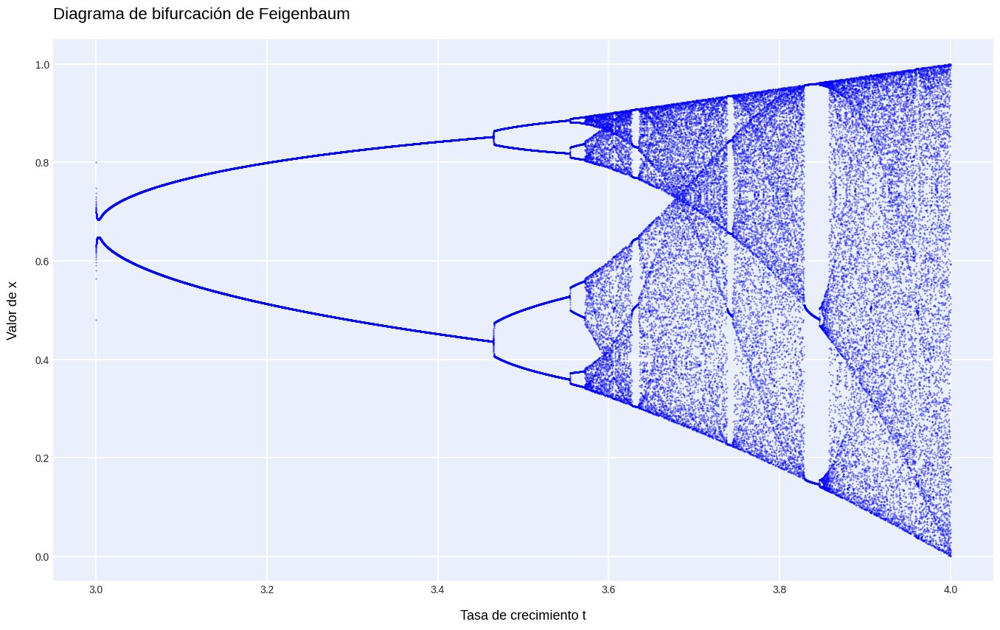

In [63]:
def feigenbaum(x0, r0, tam_paso, n_pasos):
    valores_x = np.zeros(n_pasos)
    valores_r = np.linspace(r0, r0 + tam_paso * (n_pasos - 1), n_pasos)
    valores_x[0] = x0

    for k in range(1, n_pasos):
        valores_x[k] = valores_r[k] * valores_x[k-1] * (1 - valores_x[k-1])
    return valores_x, valores_r, range(1, n_pasos+1)


x0, r0, tam_paso, n_pasos = 0.8, 3.0, 0.00001, 100000
valores_x, valores_r, pasos = feigenbaum(x0, r0, tam_paso, n_pasos)
graficar(valores_x, valores_r, plot_type='scatter', width=10, height=7, save_as_pdf=True, titulo='Diagrama de bifurcación de Feigenbaum')
guardar_datos("datosFeigenbaum.csv", [valores_x, valores_r], ["Valores x", "Valores r"])

## Diagrama de Bifurcación Exponencial de Feigenbaum

La función `feigenbaum_exp` extiende el concepto del diagrama de bifurcación de Feigenbaum usando una variación exponencial en la ecuación del modelo logístico. Esta modificación introduce un comportamiento exponencial en la respuesta del sistema, permitiendo explorar dinámicas más complejas y potencialmente caóticas en la serie temporal.

### Modelo matemático:
La ecuación modificada que se utiliza es:
$$ x_{k+1} = x_k e^{r_k (1 - x_k)} $$
donde:
- $x_k$ es el valor en el paso actual,
- $r_k$ es la tasa de crecimiento en el paso actual.

Los parámetros iniciales son los mismos que en el modelo estándar de Feigenbaum, pero esta variante puede revelar diferentes patrones y transiciones a la caótica a medida que $r$ se incrementa.

El código calcula los valores de $x$ para un rango de tasas de crecimiento $r$, y similar al caso anterior, los resultados son graficados y guardados para su posterior análisis.


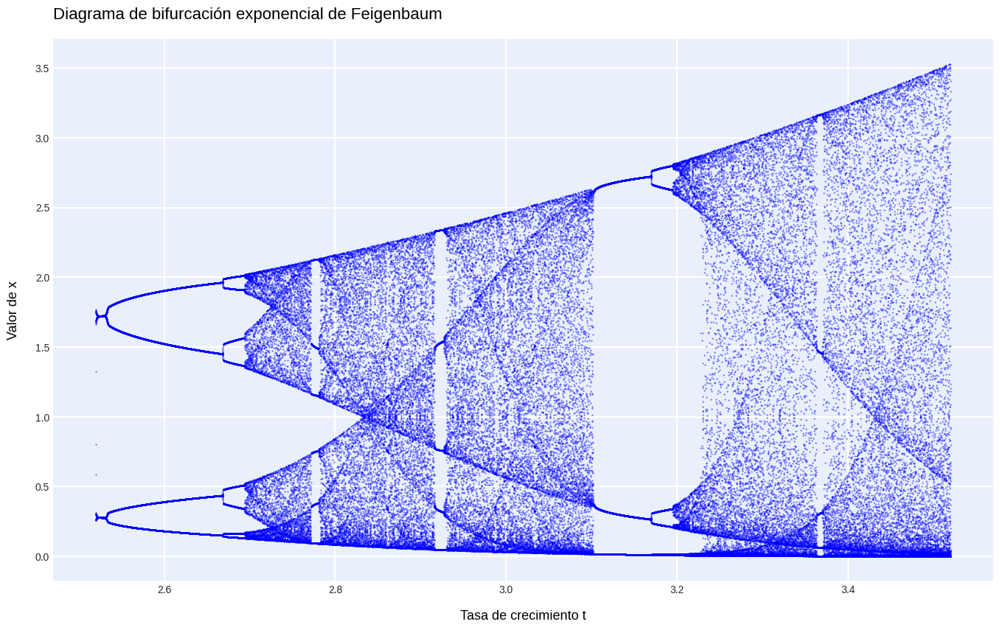

In [64]:
def feigenbaum_exp(x0, r0, tam_paso, n_pasos):
    valores_x = np.zeros(n_pasos)
    valores_r = np.linspace(r0, r0 + tam_paso * (n_pasos - 1), n_pasos)
    valores_x[0] = x0

    for k in range(1, n_pasos):
        valores_x[k] = valores_x[k-1] * np.exp(valores_r[k] * (1 - valores_x[k-1]))
    
    return valores_x, valores_r


x0, r0, tam_paso, n_pasos = 0.8, 2.52, 0.00001, 100000
valores_x, valores_r = feigenbaum_exp(x0, r0, tam_paso, n_pasos)
graficar(valores_x, valores_r, plot_type='scatter', width=10, height=7, save_as_pdf=True, titulo='Diagrama de bifurcación exponencial de Feigenbaum')
guardar_datos("datosFeigenbaumExponencial.csv", [valores_x, valores_r], ["Valores x", "Valores r"])

## Diagrama de Bifurcación Cúbica de Feigenbaum

Este código explora una variante cúbica del diagrama de Feigenbaum, donde la función de iteración se modifica para incluir términos cúbicos. Esto introduce una complejidad adicional en el sistema y puede llevar a diferentes tipos de comportamientos caóticos.

### Modelo matemático:
La ecuación modificada que se utiliza es:
$$ x_{k+1} = x_k + r_k x_k (x_k^2 - 1) $$
Esta ecuación introduce un término cúbico que altera la dinámica del sistema en comparación con el modelo logístico estándar.

El código calcula y grafica los valores de $x$ para un rango amplio de tasas de crecimiento $r$, explorando así las transiciones hacia comportamientos caóticos.


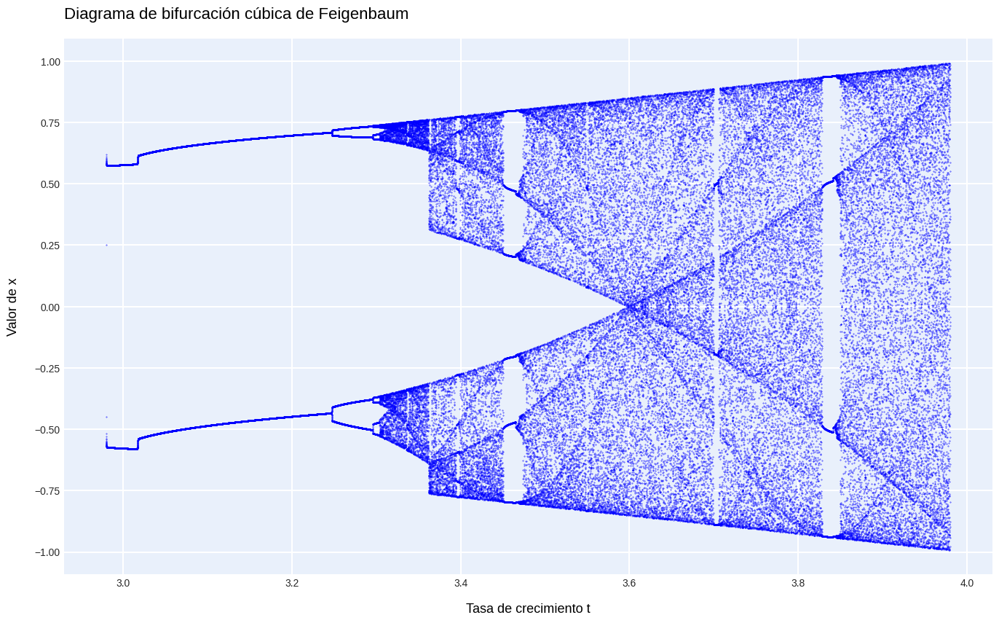

In [65]:
def feigenbaum_cubic(x0, r0, tam_paso, n_pasos):
    valores_x = np.zeros(n_pasos)
    valores_r = np.linspace(r0, r0 + tam_paso * (n_pasos - 1), n_pasos)
    valores_x[0] = x0

    for k in range(1, n_pasos):
        valores_x[k] = valores_x[k-1] + valores_r[k] * valores_x[k-1] * (valores_x[k-1]**2 - 1)
    
    return valores_x, valores_r

x0, r0, tam_paso, n_pasos = 0.25, 2.98, 0.00001, 100000
valores_x, valores_r = feigenbaum_cubic(x0, r0, tam_paso, n_pasos)
graficar(valores_x, valores_r, plot_type='scatter', width=10, height=7, save_as_pdf=True, titulo='Diagrama de bifurcación cúbica de Feigenbaum')
guardar_datos("datosFeigenbaumCubica.csv", [valores_x, valores_r], ["Valores x", "Valores r"])

## Diagrama de Bifurcación Triangular de Feigenbaum

La función `feigenbaum_triangular` introduce un modelo con dinámica triangular, donde la tasa de crecimiento cambia dependiendo de si $x$ es menor o mayor que 0.5. Esta forma de bifurcación ofrece una manera interesante de explorar cómo las pequeñas variaciones en la forma de la función de recurrencia pueden afectar la dinámica general del sistema.

### Modelo matemático:
La ecuación de recurrencia varía según el valor de $x_k$:
$$
x_{k+1} = \begin{cases} 
r_k x_k & \text{si } x_k \leq 0.5 \\
r_k (1 - x_k) & \text{si } x_k > 0.5
\end{cases}
$$
Este enfoque introduce un comportamiento no lineal distinto, llevando a diferentes tipos de patrones en el diagrama de bifurcación.

El código genera y grafica los valores de $x$ para diferentes tasas de crecimiento $r$, y guarda los resultados para análisis posteriores.


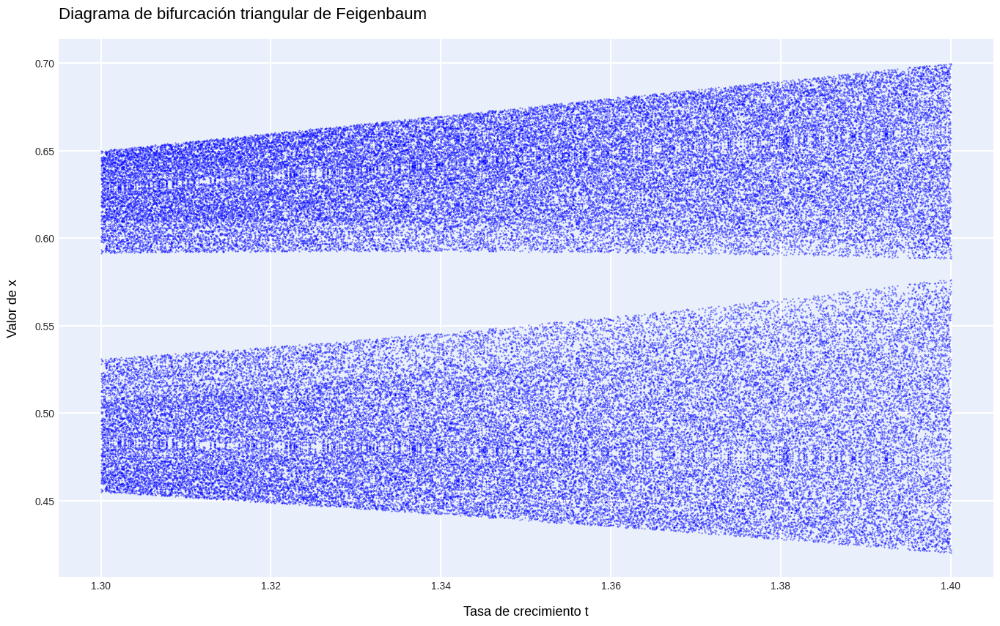

In [66]:
def feigenbaum_triangular(x0, r0, tam_paso, n_pasos):
    valores_x = np.zeros(n_pasos)
    valores_r = np.linspace(r0, r0 + tam_paso * (n_pasos - 1), n_pasos)
    valores_x[0] = x0

    for k in range(1, n_pasos):
        if valores_x[k-1] <= 0.5:
            valores_x[k] = valores_r[k] * valores_x[k-1]
        else:
            valores_x[k] = valores_r[k] * (1 - valores_x[k-1])
    
    return valores_x, valores_r

x0, r0, tam_paso, n_pasos = 0.5, 1.3, 0.000001, 100000
valores_x, valores_r = feigenbaum_triangular(x0, r0, tam_paso, n_pasos)
graficar(valores_x, valores_r, plot_type='scatter', width=10, height=7, save_as_pdf=True, titulo='Diagrama de bifurcación triangular de Feigenbaum')
guardar_datos("datosFeigenbaumTriangular.csv", [valores_x, valores_r], ["Valores x", "Valores r"])

## Diagrama de Henón

El mapa de Henón es un famoso sistema dinámico que exhibe comportamiento caótico. Es conocido por su capacidad para producir atractores extraños, que son fundamentales en el estudio de sistemas dinámicos.

### Modelo matemático:
El sistema de ecuaciones del mapa de Henón es:
$$
\begin{align*}
x_{k+1} &= 1 - a x_k^2 + y_k \\
y_{k+1} &= b x_k
\end{align*}
$$
donde $a$ y $b$ son parámetros que controlan el comportamiento del sistema.

Este código calcula y grafica los valores de $(x, y)$ para una serie de pasos, visualizando el atractor de Henón y guardando los datos para futuras referencias.


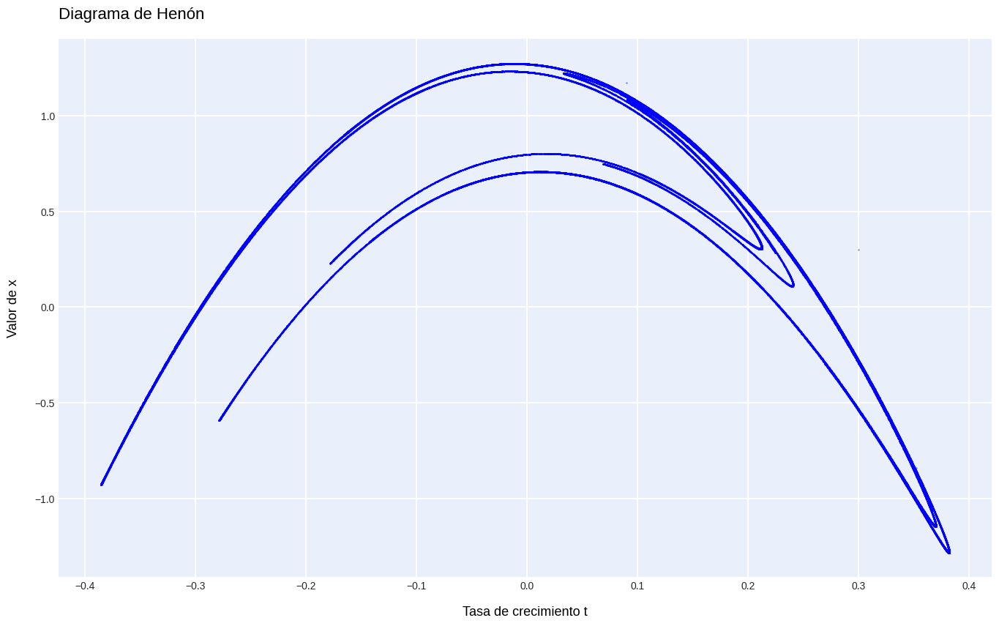

In [67]:
def henon_map(x0, y0, a, b, n_pasos):
    valores_x = np.zeros(n_pasos)
    valores_y = np.zeros(n_pasos)
    valores_x[0] = x0
    valores_y[0] = y0

    for k in range(1, n_pasos):
        valores_x[k] = 1 - a * valores_x[k-1]**2 + valores_y[k-1]
        valores_y[k] = b * valores_x[k-1]
    
    return valores_x, valores_y, range(1, n_pasos+1)


x0, y0 = 0.3, 0.3
a, b = 1.4, 0.3
n_pasos = 100000
valores_x, valores_y, pasos = henon_map(x0, y0, a, b, n_pasos)
graficar(valores_x, valores_y, plot_type='scatter', width=10, height=7, save_as_pdf=True, titulo='Diagrama de Henón')
guardar_datos("datosHenon.csv", [valores_x, valores_y], ["Valores x", "Valores y"])


## Atractor de Rossler

El atractor de Rossler es un sistema dinámico que produce un comportamiento caótico. Es uno de los ejemplos clásicos en el estudio de sistemas caóticos debido a su estructura relativamente simple pero comportamiento dinámico complejo.

### Modelo matemático:
El sistema de Rossler se describe con las siguientes ecuaciones diferenciales:
$$
\begin{align*}
\dot{x} &= -y - z \\
\dot{y} &= x + ay \\
\dot{z} &= b + z(x - c)
\end{align*}
$$
donde $a$, $b$, y $c$ son parámetros que afectan el comportamiento del sistema.

### Método de Euler para la aproximación:
El método de Euler es un procedimiento numérico simple para resolver ecuaciones diferenciales ordinarias (EDO) a partir de un valor inicial dado. Este método aproxima la solución mediante la actualización iterativa de cada variable de estado usando las derivadas calculadas:

$$
\begin{align*}
x_{i+1} &= x_i + dt \cdot \dot{x}_i \\
y_{i+1} &= y_i + dt \cdot \dot{y}_i \\
z_{i+1} &= z_i + dt \cdot \dot{z}_i
\end{align*}
$$
Este método es utilizado aquí para calcular y graficar el atractor de Rossler en el espacio tridimensional.


In [68]:
def graficar_3d(x, y, z, width=10, height=7, titulo='Figura2'):
    file_name = f"{convertir_camelCase(titulo)}.pdf"
    
    figura = go.Figure(data=[go.Scatter3d(x=x, y=y, z=z, mode='lines')])
    
    figura.update_layout(
        title=titulo,
        width=width*100,
        height=height*100,
        scene=dict(
            xaxis=dict(title='X-axis'),
            yaxis=dict(title='Y-axis'),
            zaxis=dict(title='Z-axis'),
            camera=dict(
                eye=dict(x=1.5, y=-1.3, z=0.5),
                center=dict(x=0, y=0, z=0),
                up=dict(x=0, y=0, z=1)
            )
        ),
        scene_aspectmode='cube',
        margin=dict(t=50)
    )
    
    pio.write_image(figura, file_name, format='pdf')
    figura.show()


In [69]:
def rossler_euler(x0, y0, z0, a, b, c, dt, n_pasos):
    x = np.zeros(n_pasos)
    y = np.zeros(n_pasos)
    z = np.zeros(n_pasos)
    x[0], y[0], z[0] = x0, y0, z0

    for i in range(1, n_pasos):
        x[i] = x[i-1] + dt * (-y[i-1] - z[i-1])
        y[i] = y[i-1] + dt * (x[i-1] + a * y[i-1])
        z[i] = z[i-1] + dt * (b + z[i-1] * (x[i-1] - c))

    return x, y, z, range(1, n_pasos+1)

a, b, c = 0.2, 0.2, 5.7
x0, y0, z0 = 0.0, 1.0, 1.0
dt = 0.01
n_pasos = 100000

valores_x, valores_y, valores_z, pasos = rossler_euler(x0, y0, z0, a, b, c, dt, n_pasos)
graficar_3d(valores_x, valores_y, valores_z, titulo="Atractor de Rossler")
guardar_datos("datosRossler.csv", [valores_x, valores_y, valores_z], ["Valores x", "Valores y", "Valores z"])


## Atractor de Lorenz

El atractor de Lorenz es otro sistema dinámico famoso que exhibe comportamiento caótico. Fue inicialmente introducido por Edward Lorenz en 1963 y es ampliamente estudiado en teoría del caos.

### Modelo matemático:
El sistema de Lorenz se compone de las siguientes ecuaciones diferenciales:
$$
\begin{align*}
\dot{x} &= \sigma (y - x) \\
\dot{y} &= x (\rho - z) - y \\
\dot{z} &= xy - \beta z
\end{align*}
$$
donde $\sigma$, $\beta$, y $\rho$ son parámetros que definen la dinámica del sistema.

### Método de Euler para la aproximación:
Similar al caso de Rossler, se utiliza el método de Euler para aproximar las soluciones de las ecuaciones diferenciales. Este método facilita la implementación y es adecuado para una exploración inicial de las propiedades del sistema.

$$
\begin{align*}
x_{i+1} &= x_i + dt \cdot \dot{x}_i \\
y_{i+1} &= y_i + dt \cdot \dot{y}_i \\
z_{i+1} &= z_i + dt \cdot \dot{z}_i
\end{align*}
$$
Esta aproximación permite visualizar el famoso atractor de Lorenz en tres dimensiones.


In [70]:
def lorenz_attractor(sigma, beta, rho, x0, y0, z0, dt, n_steps):
    x = np.zeros(n_steps)
    y = np.zeros(n_steps)
    z = np.zeros(n_steps)
    x[0], y[0], z[0] = x0, y0, z0

    for i in range(1, n_steps):
        x[i] = x[i-1] + dt * (sigma * (y[i-1] - x[i-1]))
        y[i] = y[i-1] + dt * (x[i-1] * (rho - z[i-1]) - y[i-1])
        z[i] = z[i-1] + dt * (x[i-1] * y[i-1] - beta * z[i-1])

    return x, y, z, range(1, n_pasos+1)


sigma, beta, rho = 10, 2.667, 28
x0, y0, z0 = 0.0, 1.0, 1.05
dt = 0.001
n_steps = 100000


valores_x, valores_y, valores_z, pasos = lorenz_attractor(sigma, beta, rho, x0, y0, z0, dt, n_steps)
graficar_3d(valores_x, valores_y, valores_z, titulo="Atractor de Lorentz")
guardar_datos("datosLorentz.csv", [valores_x, valores_y, valores_z], ["Valores x", "Valores y", "Valores z"])